# Roaming Data Exploration

In [1]:
import pyspark.sql.functions as F
from pyspark.sql.types import *
import json,boto3
from datetime import datetime,timedelta
import pandas as pd
# get daily event count
def get_date(dt_in=None):
    try:
        temp = datetime.strptime(dt_in[0:19], '%Y-%m-%dT%H:%M:%S')
        return str(temp.date())
    except:
        return None


get_dateUDF = F.udf(get_date,StringType())

VBox()

Starting Spark application


ID,YARN Application ID,Kind,State,Spark UI,Driver log,Current session?
187,application_1605542900849_0797,pyspark,idle,Link,Link,✔


FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

SparkSession available as 'spark'.


FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

In [2]:
%%local
import plotly.express as px

# Daily Event Count
1. client-roam
2. suboptimal-roam
3. pingpong-roam
4. sticky-client

In [3]:
df_all = spark.read.option("header",True).csv("s3://mist-data-science-dev/may/roaming_exploration/daily_event_count")\
            .filter(F.col("date")>='2021-02-09')\
            .select("date",F.col("event_count").cast(LongType()),"event_type",F.col("count_distinct_wc").cast(LongType())) #F.to_date(F.col("date").cast(TimestampType())).alias("date")

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+----------+-----------+-------------+-----------------+
|      date|event_count|   event_type|count_distinct_wc|
+----------+-----------+-------------+-----------------+
|2021-02-16|     678542|sticky-client|            36110|
|2021-02-09|      50159|sticky-client|             3156|
|2021-02-18|     750229|sticky-client|            37703|
|2021-02-10|     585622|sticky-client|            29740|
|2021-02-13|     675713|sticky-client|            29465|
|2021-02-14|     328811|sticky-client|            24395|
|2021-02-15|     590071|sticky-client|            30906|
|2021-02-17|     701604|sticky-client|            36645|
|2021-02-20|      83597|sticky-client|             9848|
|2021-02-19|     815166|sticky-client|            38330|
|2021-02-12|     797668|sticky-client|            35167|
|2021-02-11|     701694|sticky-client|            34820|
|2021-02-16|  116597768|  client-roam|          3332797|
|2021-02-09|   42766885|  client-roam|          2146350|
|2021-02-18|  123070329|  clien

In [4]:
%%spark -o df_all

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

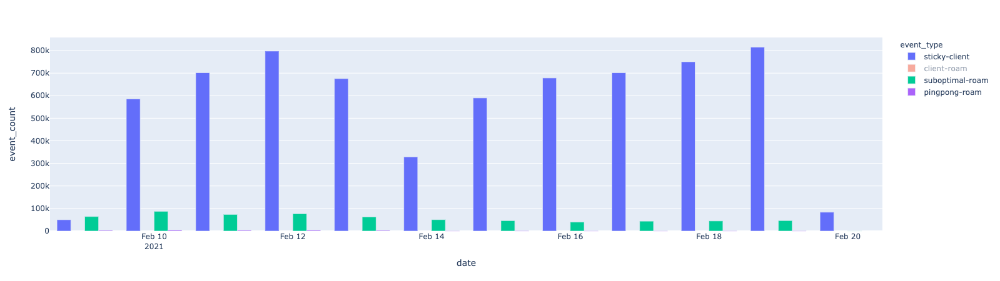

In [11]:
%%local
# Event Comparison
px.bar(df_all,x="date", y="event_count", color="event_type", barmode="group")

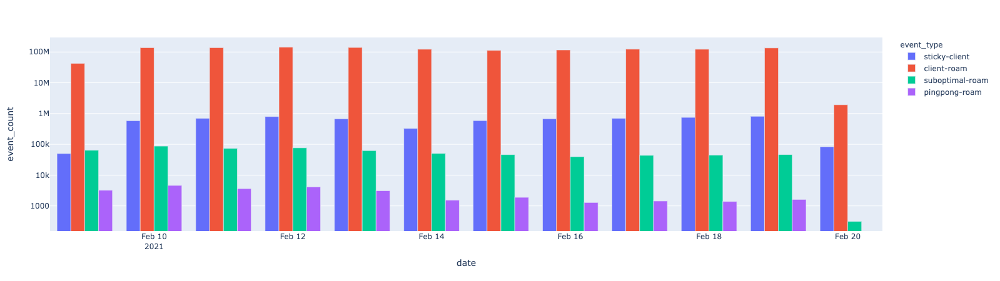

In [6]:
%%local
# Event Count in log scale
px.bar(df_all,x="date", y="event_count", color="event_type", barmode="group",log_y=True)

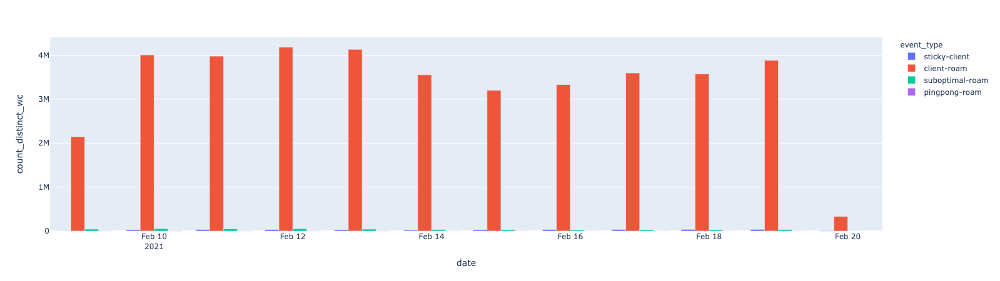

In [100]:
%%local
#Count Distinct WC comparison
px.bar(df_all,x="date", y="count_distinct_wc", color="event_type", barmode="group")

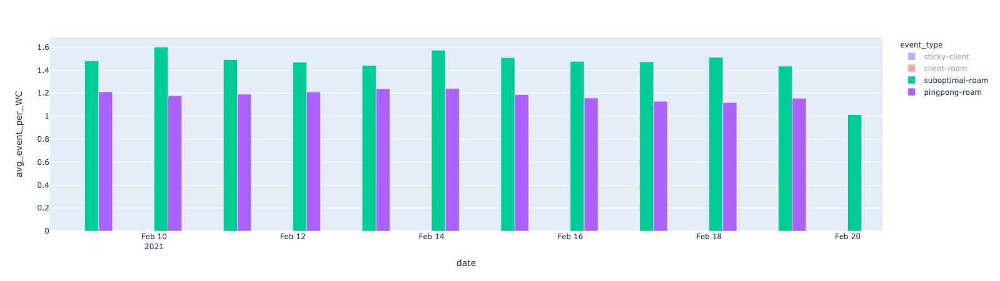

In [16]:
%%local
# Average Event Per Client
df_all["avg_event_per_WC"] = df_all[["count_distinct_wc","event_count"]].apply(lambda x:x[1]/x[0],axis=1)
px.bar(df_all,x="date", y="avg_event_per_WC", color="event_type", barmode="group")

In [3]:
# Get org Name
df_org= spark.read.parquet("s3://mist-secorapp-production/dimension/org/org.parquet").select(F.col("id").alias("OrgID"),"name")
df_org.show(3)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+--------------------+----------+
|               OrgID|      name|
+--------------------+----------+
|e33ade80-f2d5-11e...|      mist|
|0fe71a27-54a6-4a4...|SuiteTreat|
|58656846-1c35-11e...|     Cisco|
+--------------------+----------+
only showing top 3 rows

# OrgID with top 10 event counts

In [9]:
df_cr = spark.read.parquet("s3://mist-data-science-dev/may/roaming_exploration/org_client_roam/").select("OrgID","name","date",F.col("suboptimal_event_count").alias("client_roam_event_count"),"dt")
temp_cr = df_cr.groupby("OrgID","name").agg(F.sum("client_roam_event_count").alias("client_roam_event_count")).sort(F.desc("client_roam_event_count")).limit(10)

df_event_count = spark.read.parquet("s3://mist-data-science-dev/may/roaming_exploration/org_event/").join(df_org,"OrgID")
temp_sp = df_event_count.groupby("OrgID","name").agg(F.sum("suboptimal_event_count").alias("suboptimal_event_count")).sort(F.desc("suboptimal_event_count")).limit(10)

temp_pp = df_event_count.groupby("OrgID","name").agg(F.sum("pingpong_event_count").alias("pingpong_event_count")).sort(F.desc("pingpong_event_count")).limit(10)

df_sticky_client = spark.read.parquet("s3://mist-data-science-dev/may/roaming_exploration/sticky_client_flatten/").join(df_org,"OrgID")
df_sticky_client_count = df_sticky_client.groupby("OrgID","name","Band","date").agg(F.count("When").alias("sticky_client_event_count"))
temp_sc = df_sticky_client_count.groupby("OrgID","name").agg(F.sum("sticky_client_event_count").alias("sticky_client_event_count")).sort(F.desc("sticky_client_event_count")).limit(10)

df_all = temp_cr.join(temp_sp,["OrgID","name"],"outer").join(temp_pp,["OrgID","name"],"outer").join(temp_sc,["OrgID","name"],"outer").select("OrgID").distinct()

df_cr_total = df_cr.groupby("OrgID","name").agg(F.sum("client_roam_event_count").alias("client_roam_event_count")).join(df_all,"OrgID","inner")
df_sp_total = df_event_count.groupby("OrgID","name").agg(F.sum("suboptimal_event_count").alias("suboptimal_roam_event_count")).join(df_all,"OrgID","inner")
df_pp_total = df_event_count.groupby("OrgID","name").agg(F.sum("pingpong_event_count").alias("pingpong_roam_event_count")).join(df_all,"OrgID","inner")
df_sc_total = df_sticky_client_count.groupby("OrgID","name").agg(F.sum("sticky_client_event_count").alias("sticky_client_event_count")).join(df_all,"OrgID","inner")

df_final = df_cr_total.join(df_sp_total,["OrgID","name"],"outer").join(df_pp_total,["OrgID","name"],"outer").join(df_sc_total,["OrgID","name"],"outer")
df_final.show(2)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+--------------------+------+-----------------------+---------------------------+-------------------------+-------------------------+
|               OrgID|  name|client_roam_event_count|suboptimal_roam_event_count|pingpong_roam_event_count|sticky_client_event_count|
+--------------------+------+-----------------------+---------------------------+-------------------------+-------------------------+
|39b04356-4cc3-41c...|Meijer|               16178104|                      30576|                      118|                     null|
|b2e5fc49-d460-42b...|WeWork|                 600387|                       1351|                       21|                   361642|
+--------------------+------+-----------------------+---------------------------+-------------------------+-------------------------+
only showing top 2 rows

In [10]:
%%spark -o df_final

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

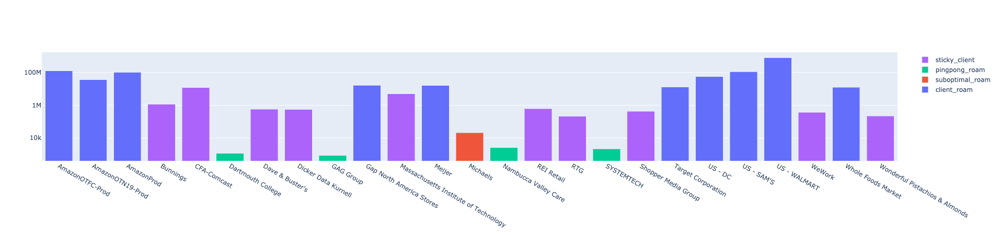

In [41]:
%%local

import plotly.graph_objects as go

#x=['b', 'a', 'c', 'd']
fig = go.Figure(go.Bar(x=df_all["name"], y=df_all["client_roam_event_count"], name='client_roam'))
fig.add_trace(go.Bar(x=df_all["name"], y=df_all["suboptimal_event_count"], name='suboptimal_roam'))
fig.add_trace(go.Bar(x=df_all["name"], y=df_all["pingpong_event_count"], name='pingpong_roam'))
fig.add_trace(go.Bar(x=df_all["name"], y=df_all["sticky_client_event_count"], name='sticky_client'))

fig.update_yaxes(type="log")

fig.update_layout(barmode='stack')
fig.update_xaxes(categoryorder='category ascending')
fig.show()

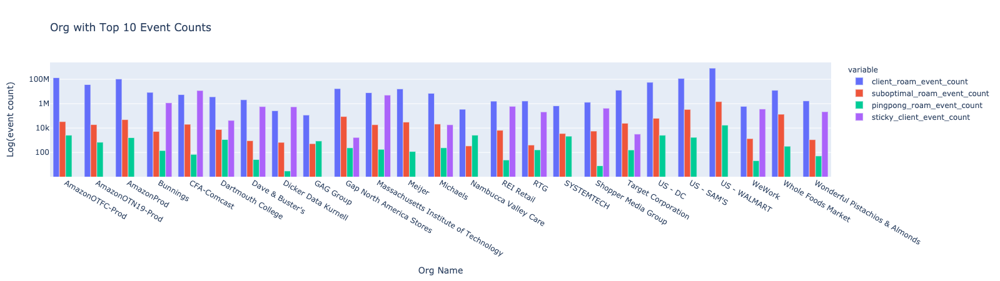

In [17]:
%%local
fig = px.bar(df_final,x="name",\
       y=["client_roam_event_count","suboptimal_roam_event_count","pingpong_roam_event_count","sticky_client_event_count"],barmode="group",title="Org with Top 10 Event Counts",log_y=True)

fig.update_layout(
    xaxis_title="Org Name",
    yaxis_title="Log(event count)",
)

fig.update_xaxes(categoryorder='category ascending')
fig.show()

### Client Roam

In [12]:
df_cr = spark.read.parquet("s3://mist-data-science-dev/may/roaming_exploration/org_client_roam/").select("OrgID","name","date",F.col("suboptimal_event_count").alias("client_roam_event_count"),"dt")
temp_cr = df_cr.groupby("OrgID","name").agg(F.sum("client_roam_event_count").alias("client_roam_event_count")).sort(F.desc("client_roam_event_count")).limit(10)
temp_cr.show()
df_cr_top_10 = df_cr.join(temp_cr.select("OrgID"),"OrgID")

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+--------------------+--------------------+-----------------------+
|               OrgID|                name|client_roam_event_count|
+--------------------+--------------------+-----------------------+
|bbb101eb-b62d-4fb...|        US - WALMART|              816422056|
|56de201d-e63b-431...|     AmazonOTFC-Prod|              133845317|
|604411f1-4e45-4be...|          US - SAM'S|              115557040|
|d8cec22e-e0c2-11e...|          AmazonProd|              104128909|
|d9ca39f2-a2cd-40a...|             US - DC|               56236782|
|5a578f3c-f094-4d1...|    AmazonOTN19-Prod|               36533661|
|c1cac1c4-1753-4dd...|Gap North America...|               17049655|
|39b04356-4cc3-41c...|              Meijer|               16178104|
|22f1cc2d-ea8a-47e...|  Target Corporation|               12786259|
|0f2adb1c-8843-448...|  Whole Foods Market|               12437717|
+--------------------+--------------------+-----------------------+

In [13]:
%%spark -o df_cr_top_10

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

In [13]:
temp_cr.show()

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+--------------------+--------------------+-----------------------+
|               OrgID|                name|client_roam_event_count|
+--------------------+--------------------+-----------------------+
|bbb101eb-b62d-4fb...|        US - WALMART|              816422056|
|56de201d-e63b-431...|     AmazonOTFC-Prod|              133845317|
|604411f1-4e45-4be...|          US - SAM'S|              115557040|
|d8cec22e-e0c2-11e...|          AmazonProd|              104128909|
|d9ca39f2-a2cd-40a...|             US - DC|               56236782|
|5a578f3c-f094-4d1...|    AmazonOTN19-Prod|               36533661|
|c1cac1c4-1753-4dd...|Gap North America...|               17049655|
|39b04356-4cc3-41c...|              Meijer|               16178104|
|22f1cc2d-ea8a-47e...|  Target Corporation|               12786259|
|0f2adb1c-8843-448...|  Whole Foods Market|               12437717|
+--------------------+--------------------+-----------------------+

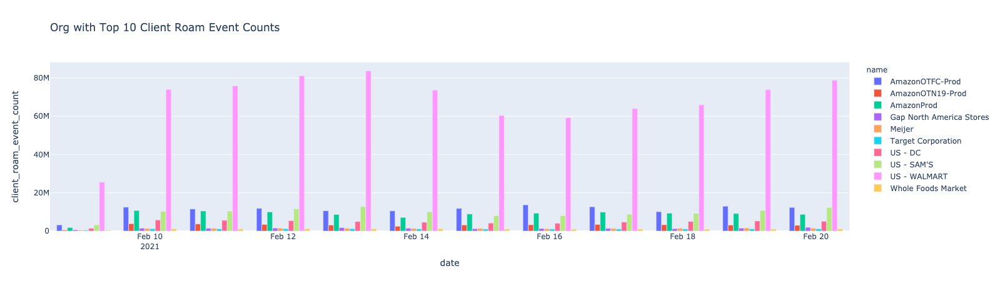

In [24]:
%%local
px.bar(df_cr_top_10.groupby(["name","date"]).client_roam_event_count.sum().reset_index(),x="date",y="client_roam_event_count",color="name",barmode="group",title="Org with Top 10 Client Roam Event Counts")

### Suboptimal Roam

In [9]:
df_event_count = spark.read.parquet("s3://mist-data-science-dev/may/roaming_exploration/org_event/").join(df_org,"OrgID")
temp_sp = df_event_count.groupby("OrgID","name").agg(F.sum("suboptimal_event_count").alias("suboptimal_event_count")).sort(F.desc("suboptimal_event_count")).limit(10)
df_suboptimal_roam_count = df_event_count.join(temp_sp.select("OrgID"),"OrgID")
temp_pp = df_event_count.groupby("OrgID","name").agg(F.sum("pingpong_event_count").alias("pingpong_event_count")).sort(F.desc("pingpong_event_count")).limit(10)
df_pingpong_event_count = df_event_count.join(temp_pp.select("OrgID"),"OrgID")

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

In [38]:
%%spark -o df_suboptimal_roam_count

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

In [37]:
temp_sp.show()

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+--------------------+--------------------+----------------------+
|               OrgID|                name|suboptimal_event_count|
+--------------------+--------------------+----------------------+
|bbb101eb-b62d-4fb...|        US - WALMART|               1467138|
|604411f1-4e45-4be...|          US - SAM'S|                335045|
|0f2adb1c-8843-448...|  Whole Foods Market|                134964|
|c1cac1c4-1753-4dd...|Gap North America...|                 87467|
|d9ca39f2-a2cd-40a...|             US - DC|                 62965|
|d8cec22e-e0c2-11e...|          AmazonProd|                 48580|
|56de201d-e63b-431...|     AmazonOTFC-Prod|                 33444|
|39b04356-4cc3-41c...|              Meijer|                 30576|
|22f1cc2d-ea8a-47e...|  Target Corporation|                 24659|
|e1bde705-bd39-408...|            Michaels|                 21148|
+--------------------+--------------------+----------------------+

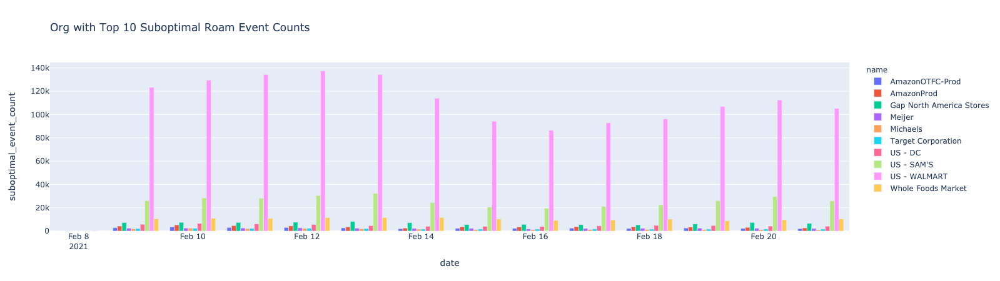

In [39]:
%%local
px.bar(df_suboptimal_roam_count.groupby(["name","date"]).suboptimal_event_count.sum().reset_index(),x="date",y="suboptimal_event_count",color="name",barmode="group",title="Org with Top 10 Suboptimal Roam Event Counts")

### PingPong Roam

In [40]:
%%spark -o df_pingpong_event_count

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

In [44]:
temp_pp.show()

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+--------------------+--------------------+--------------------+
|               OrgID|                name|pingpong_event_count|
+--------------------+--------------------+--------------------+
|bbb101eb-b62d-4fb...|        US - WALMART|               17309|
|52ca4540-62b5-4ed...|Nambucca Valley Care|                2592|
|56de201d-e63b-431...|     AmazonOTFC-Prod|                2572|
|d9ca39f2-a2cd-40a...|             US - DC|                2553|
|2eed5700-cb1e-425...|          SYSTEMTECH|                2143|
|604411f1-4e45-4be...|          US - SAM'S|                1717|
|d8cec22e-e0c2-11e...|          AmazonProd|                1616|
|790be815-af8f-4dc...|   Dartmouth College|                1136|
|3098d079-88b7-438...|           GAG Group|                 864|
|5a578f3c-f094-4d1...|    AmazonOTN19-Prod|                 681|
+--------------------+--------------------+--------------------+

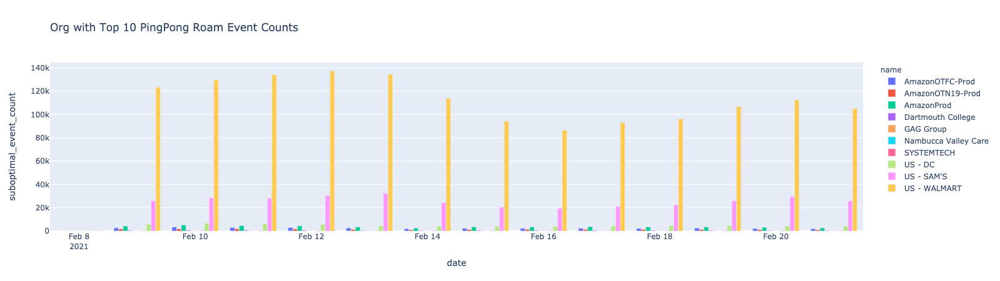

In [43]:
%%local
px.bar(df_pingpong_event_count.groupby(["name","date"]).suboptimal_event_count.sum().reset_index(),x="date",y="suboptimal_event_count",color="name",barmode="group",title="Org with Top 10 PingPong Roam Event Counts")

### Sticky Client

In [10]:
df_sticky_client = spark.read.parquet("s3://mist-data-science-dev/may/roaming_exploration/sticky_client_flatten/").join(df_org,"OrgID")
df_sticky_client_count = df_sticky_client.groupby("OrgID","name","Band","date").agg(F.count("When").alias("sticky_client_event_count"))
temp_sc = df_sticky_client_count.groupby("OrgID","name").agg(F.sum("sticky_client_event_count").alias("sticky_client_event_count")).sort(F.desc("sticky_client_event_count")).limit(10)
df_sticky_client_top_10 = df_sticky_client_count.join(temp_sc.select("OrgID"),"OrgID","inner")

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

In [23]:
%%spark -o df_sticky_client_top_10

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

In [11]:
temp_sc.show()

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+--------------------+--------------------+-------------------------+
|               OrgID|                name|sticky_client_event_count|
+--------------------+--------------------+-------------------------+
|4f7ce014-2148-4d4...|         CFA-Comcast|                 11893535|
|0992350f-e897-471...|Massachusetts Ins...|                  5034042|
|a15b4c50-378e-410...|            Bunnings|                  1160525|
|758a1f7f-6d65-4d8...|          REI Retail|                   604490|
|9de2eacf-bc8a-46c...|     Dave & Buster's|                   573004|
|2cd327d0-d323-4be...| Dicker Data Kurnell|                   550419|
|20101562-d4f8-41a...| Shopper Media Group|                   423377|
|b2e5fc49-d460-42b...|              WeWork|                   361642|
|4a7f417d-a4b1-445...|Wonderful Pistach...|                   217309|
|a5f0b940-965c-486...|                 RTG|                   211464|
+--------------------+--------------------+-------------------------+

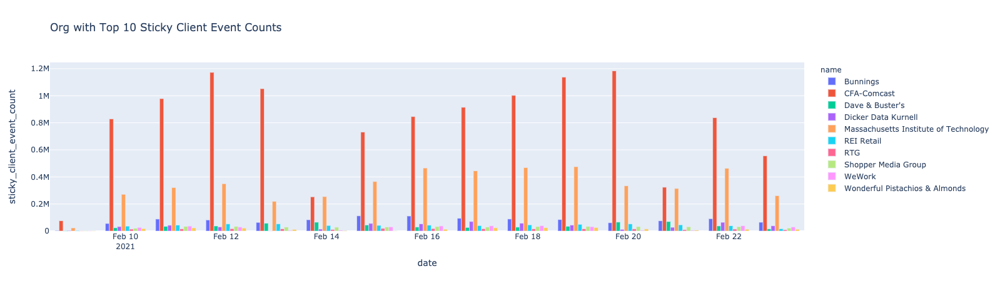

In [28]:
%%local
px.bar(df_sticky_client_top_10.groupby(["name","date"]).sticky_client_event_count.sum().reset_index(),x="date",y="sticky_client_event_count",color="name",barmode="group",title="Org with Top 10 Sticky Client Event Counts")

# Client Roam

## Assocation Failure

In [19]:
df_AssocFail = spark.read.parquet("s3://mist-data-science-dev/may/roaming_exploration/client_roam_AssocFail/")
df_AssocFail.groupby("AssocFailReason","Roamtype").agg(F.sum("event_count").alias("event_count")).show()

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+---------------+---------+-----------+
|AssocFailReason| Roamtype|event_count|
+---------------+---------+-----------+
|             12|         |          1|
|              1|slow_roam|         46|
|              1|         |          3|
+---------------+---------+-----------+

In [16]:
%%spark -o df_AssocFail

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

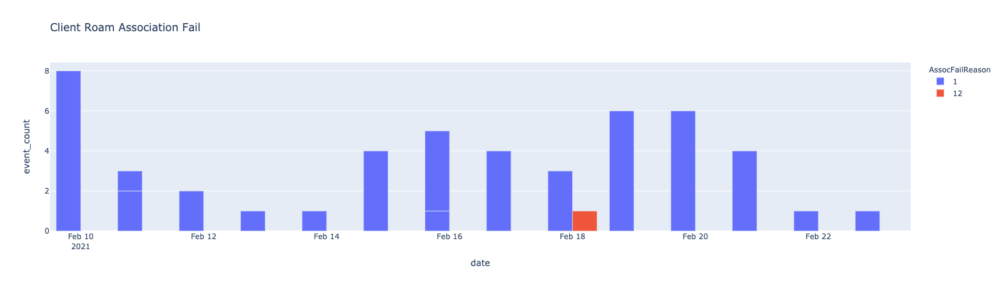

In [20]:
%%local
df_AssocFail["AssocFailReason"] = df_AssocFail["AssocFailReason"].astype(str)
px.bar(df_AssocFail.groupby(["date","AssocFailReason","Roamtype"]).event_count.sum().reset_index(),x="date",y="event_count",color = "AssocFailReason",barmode="group",title="Client Roam Association Fail",hover_data=['Roamtype'])

## Authentication Failure

In [20]:
df_AuthFail = spark.read.parquet("s3://mist-data-science-dev/may/roaming_exploration/client_roam_AuthFail/")
df_AuthFail.groupby("AuthFailReason","Roamtype").agg(F.sum("event_count").alias("event_count")).sort(F.desc("event_count")).show()

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+--------------+---------+-----------+
|AuthFailReason| Roamtype|event_count|
+--------------+---------+-----------+
|           258|         |     694134|
|           258|slow_roam|     413726|
|             0|fast_roam|     319088|
|            23|         |     297383|
|            23|slow_roam|      66129|
|            16|         |      52893|
|            15|slow_roam|      35127|
|            15|         |      30741|
|            16|fast_roam|      17658|
|            23|fast_roam|      16753|
|             0|         |       9699|
|            16|slow_roam|       6039|
|            17|slow_roam|       4337|
|           258|fast_roam|       3883|
|            14|         |       2375|
|             2|         |       2018|
|           512|         |       1670|
|            17|         |       1307|
|             2|slow_roam|       1255|
|            14|slow_roam|       1031|
+--------------+---------+-----------+
only showing top 20 rows

In [ ]:
df_AuthFail.groupby("OrgID").agg(F.sum("event_count")).join

In [21]:
%%spark -o df_AuthFail

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

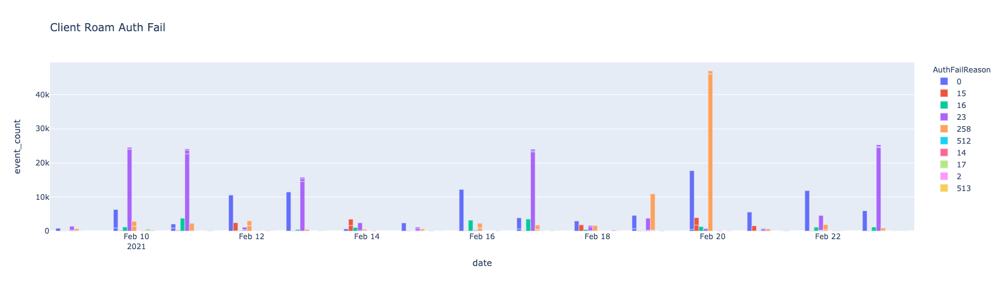

In [24]:
%%local
df_AuthFail["AuthFailReason"] = df_AuthFail["AuthFailReason"].astype(str)
px.bar(df_AuthFail.groupby(["date","AuthFailReason","Roamtype"]).event_count.sum().reset_index(),x="date",y="event_count",color = "AuthFailReason",barmode="group",title="Client Roam Auth Fail",hover_data=['Roamtype'])

## Fast Roam Failure

In [4]:
df_FastRoamFail = spark.read.parquet("s3://mist-data-science-dev/may/roaming_exploration/client_roam_FastRoamFail/")
df_FastRoamFail.groupby("FastRoamFailCause","Roamtype").agg(F.sum("event_count").alias("event_count")).sort(F.desc("event_count")).show()

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+-----------------+---------+-----------+
|FastRoamFailCause| Roamtype|event_count|
+-----------------+---------+-----------+
|               79|fast_roam|     286429|
|               53|fast_roam|      44825|
|               53|slow_roam|        511|
|               79|slow_roam|        258|
|                1|fast_roam|         18|
|                1|slow_roam|          1|
+-----------------+---------+-----------+

In [5]:
%%spark -o df_FastRoamFail

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

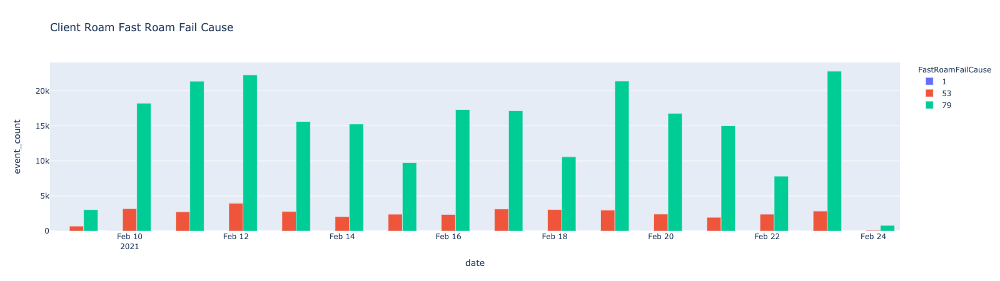

In [7]:
%%local
df_FastRoamFail["FastRoamFailCause"] = df_FastRoamFail["FastRoamFailCause"].astype(str)
px.bar(df_FastRoamFail.groupby(["date","FastRoamFailCause","Roamtype"]).event_count.sum().reset_index(),x="date",y="event_count",color = "FastRoamFailCause",barmode="group",title="Client Roam Fast Roam Fail Cause",hover_data=['Roamtype'])

In [ ]:
%%spark -o temp

In [ ]:
%%local
px.bar(temp,x="date",y="event_count",color="Band",barmode="group",title = "Event Count of FastRoamFail.")

In [25]:
df_cr = spark.read.parquet("s3://mist-data-science-dev/may/roaming_exploration/client_roam_latency/").filter(F.col("Roamtype").isin("slow_roam","fast_roam"))
df_cr.show(5)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+---------+----+--------+------+----------+-----------------+-----------+------------------+--------------+--------------+------------------+---------------+---------------+
| Roamtype|Band|PrevBand|SameAP|      date|count_Distinct_WC|event_count|median_RoamLatency|RoamLatency_75|RoamLatency_95|  mean_RoamLatency|max_RoamLatency|min_RoamLatency|
+---------+----+--------+------+----------+-----------------+-----------+------------------+--------------+--------------+------------------+---------------+---------------+
|slow_roam| 2.4|       5|  true|2021-02-20|             5354|       9316|             0.028|         0.067|         1.029| 6004.659035030513| 1.9154175698E7|            0.0|
|slow_roam| 2.4|     2.4|  true|2021-02-16|               11|         11|             0.018|         0.653|       16.8095| 3.184272727272727|          30.49|          0.007|
|slow_roam|   5|        | false|2021-02-19|             7097|      57045|             0.211|         0.238|         0.266|26.55976

In [26]:
%%spark -o df_cr

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

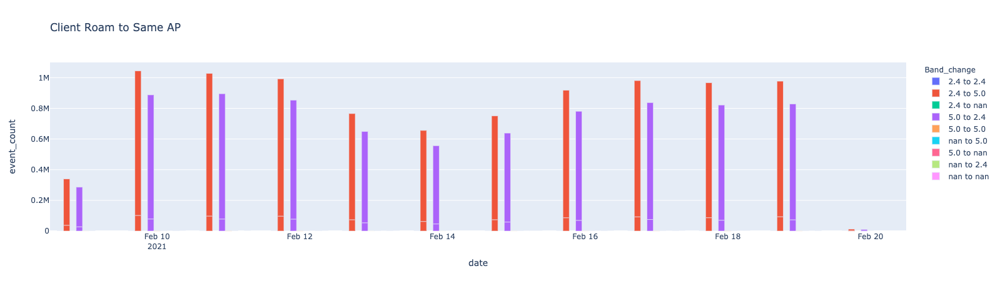

In [9]:
%%local
df_cr["Band_change"] = df_cr[["Band","PrevBand"]].apply(lambda x: "{} to {}".format(x[1],x[0]),axis=1)
#df_cr.head()
px.bar(df_cr[df_cr["SameAP"]==True].groupby(["date","Band_change","Roamtype"]).event_count.sum().reset_index(),x="date", y="event_count", color="Band_change", barmode="group",title="Client Roam to Same AP",hover_data=['Roamtype', 'event_count'])

In [6]:
# roam to same AP
df_croam.filter((F.col("FromAP")==F.col("ToAP")) & (F.col("Band")==F.col("PrevBand"))).show(5)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+---------+---------------+--------+--------+--------------+--------+----+------------+------------+-----------------+-----------------+--------------------+------------------+--------+---------+-----------+----------+-------------------+--------------------+-----+-----------+-----------------+-------+-----------------+--------------------+--------------------+
|AssocFail|AssocFailReason|AuthAlgo|AuthFail|AuthFailReason|AuthType|Band|Capabilities|FastRoamFail|FastRoamFailCause|           FromAP|               OrgID|PotentialCandidate|PrevBand| Roamtype|       SSID|SinceAssoc|          SinceAuth|              SiteID|State|  TimeDelta|             ToAP|Version|               WC|                When|              WlanID|
+---------+---------------+--------+--------+--------------+--------+----+------------+------------+-----------------+-----------------+--------------------+------------------+--------+---------+-----------+----------+-------------------+--------------------+-----+-------

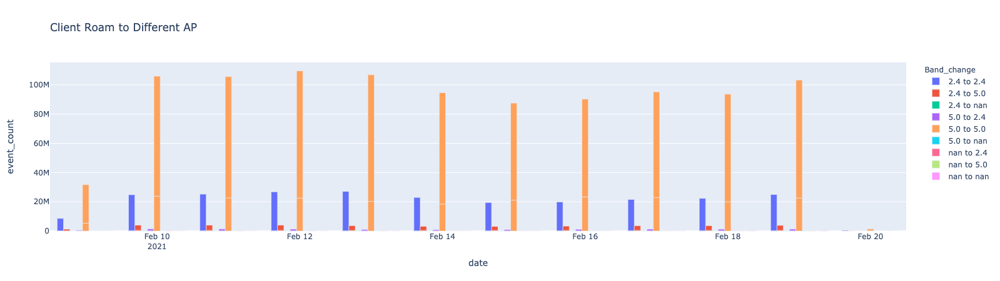

In [28]:
%%local
df_cr["Band_change"] = df_cr[["Band","PrevBand"]].apply(lambda x: "{} to {}".format(x[1],x[0]),axis=1)
#df_cr.head()
px.bar(df_cr[df_cr["SameAP"]==False].groupby(["date","Band_change","Roamtype"]).event_count.sum().reset_index(),x="date", y="event_count", color="Band_change", barmode="group",title="Client Roam to Different AP",hover_data=['Roamtype', 'event_count'])

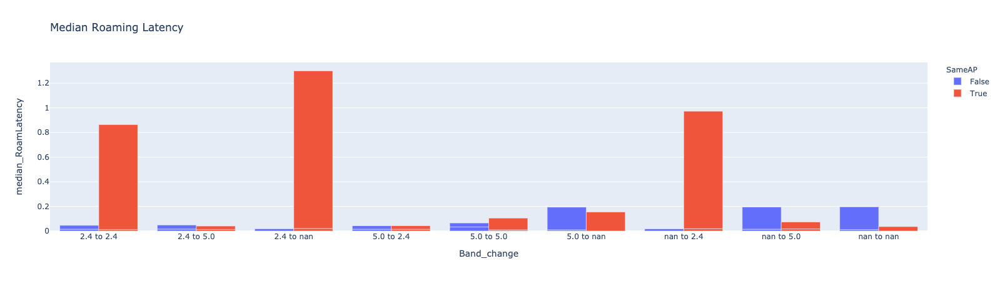

In [29]:
%%local
px.bar(df_cr.groupby(["Band_change","Roamtype","SameAP"]).median_RoamLatency.mean().reset_index(),x="Band_change", y="median_RoamLatency", color="SameAP", barmode="group",title="Median Roaming Latency",hover_data=['Roamtype', 'SameAP'])

In [14]:
df_cr.filter(F.col("SameAP")==True).sort(F.desc("RoamLatency_95")).show()

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+---------+----+--------+------+----------+-----------------+-----------+--------------------+-------------------+------------------+------------------+----------------+---------------+
| Roamtype|Band|PrevBand|SameAP|      date|count_Distinct_WC|event_count|  median_RoamLatency|     RoamLatency_75|    RoamLatency_95|  mean_RoamLatency| max_RoamLatency|min_RoamLatency|
+---------+----+--------+------+----------+-----------------+-----------+--------------------+-------------------+------------------+------------------+----------------+---------------+
|slow_roam| 2.4|     2.4|  true|2021-02-10|                9|         10|              0.0155|            0.03775| 679.4622999999988|124.09969999999998|         1210.78|          0.008|
|slow_roam|   5|     2.4|  true|2021-02-14|           121114|     593416|               0.029|              0.447|          69.28895| 16581.88331065381|1.613340787062E9|            0.0|
|slow_roam|   5|     2.4|  true|2021-02-13|           139781|     6919

# Suboptimal Roam

In [6]:
df_sr= spark.read.parquet("s3://mist-data-science-dev/may/roaming_exploration/total_suboptimal_roam_rssi_diff/")
df_sr.show()

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+------+-----------------+-----------+----------------+------------+------------+-------------------+-------------+-------------+
|SameAP|count_distinct_wc|event_count|median_RSSI_diff|RSSI_diff_75|RSSI_diff_95|     mean_RSSI_diff|max_RSSI_diff|min_RSSI_diff|
+------+-----------------+-----------+----------------+------------+------------+-------------------+-------------+-------------+
|  true|            64646|     282780|           -12.0|        -9.0|        -7.0|-13.157627837895184|           -7|          -86|
| false|           457452|     945583|           -12.0|        -9.0|        -7.0| -13.82344648751088|           -7|          -91|
+------+-----------------+-----------+----------------+------------+------------+-------------------+-------------+-------------+

In [8]:
df_sr = spark.read.parquet("s3://mist-data-science-dev/may/roaming_exploration/suboptimal_roam_rssi_diff/")
df_sr.show(10)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+----------+------+-----------------+-----------+----------------+------------+------------+-------------------+-------------+-------------+
|      date|SameAP|count_distinct_wc|event_count|median_RSSI_diff|RSSI_diff_75|RSSI_diff_95|     mean_RSSI_diff|max_RSSI_diff|min_RSSI_diff|
+----------+------+-----------------+-----------+----------------+------------+------------+-------------------+-------------+-------------+
|2021-02-17| false|            24918|      31700|           -12.0|        -9.0|        -7.0| -14.01435331230284|           -7|          -76|
|2021-02-07|  true|             4124|      11572|           -12.0|        -9.0|        -7.0|-13.162115451088836|           -7|          -76|
|2021-02-20| false|              234|        238|           -12.0|        -9.0|        -7.0|-13.617647058823529|           -7|          -32|
|2021-02-18|  true|             4760|      12610|           -12.0|        -9.0|        -7.0|-13.141950832672482|           -7|          -75|
|2021-02-13| 

In [20]:
%%spark -o df_sr

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

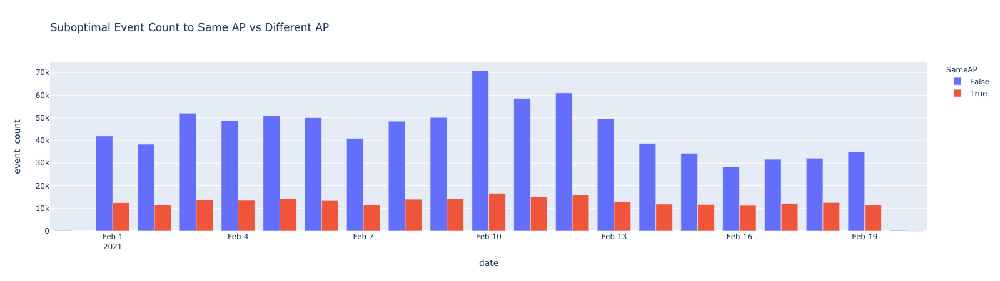

In [21]:
%%local
# suboptimal event comp betwee same and different AP.
px.bar(df_sr.groupby(["date","SameAP"]).event_count.sum().reset_index(),x="date",y="event_count",color="SameAP",barmode="group",title="Suboptimal Event Count to Same AP vs Different AP")

# PingPong Roam

In [36]:
#ping Pong roam raw data
input_files = "s3://mist-secorapp-production/client-pingpong-roaming/client-pingpong-roaming-production/dt=2021-02*/*/*.seq"
data_rdd = spark.sparkContext.sequenceFile(input_files).map(lambda r: json.loads(r[1]))
df_pp= spark.createDataFrame(data_rdd)
df_pp.printSchema()
df_pp.show(5)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

root
 |-- FromAP: string (nullable = true)
 |-- NumRoams: long (nullable = true)
 |-- OrgID: string (nullable = true)
 |-- SiteID: string (nullable = true)
 |-- ToAP: string (nullable = true)
 |-- Version: long (nullable = true)
 |-- WC: string (nullable = true)
 |-- When: string (nullable = true)
 |-- Window: long (nullable = true)
 |-- WlanID: string (nullable = true)

+-----------------+--------+--------------------+--------------------+-----------------+-------+-----------------+--------------------+------------+--------------------+
|           FromAP|NumRoams|               OrgID|              SiteID|             ToAP|Version|               WC|                When|      Window|              WlanID|
+-----------------+--------+--------------------+--------------------+-----------------+-------+-----------------+--------------------+------------+--------------------+
|5c-5b-35-d2-4b-5d|       3|bbb101eb-b62d-4fb...|94e4e435-136b-49c...|d4-20-b0-c2-1b-06|      1|c6-4b-52-48-97-9c|20

In [24]:
df_pp.groupby("NumRoams").agg(F.count("WC")).show(10)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+--------+---------+
|NumRoams|count(WC)|
+--------+---------+
|       3|    68387|
+--------+---------+

In [28]:
df_pp = spark.read.parquet("s3://mist-data-science-dev/may/roaming_exploration/pingpong_roam_agg/").filter(F.col("IsPingPong")==True).withColumn("day",F.date_format("date", 'E'))
df_pp.show(5)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+----------+------+----------+-----------+------------------+--------------------------+----------------------+----------------------+------------------------+-----------------------+-----------------------+---+
|      date|SameAP|IsPingPong|event_count|count_distinct_mac|median_pingpong_duration_s|pingpong_duration_s_75|pingpong_duration_s_95|mean_pingpong_duration_s|max_pingpong_duration_s|min_pingpong_duration_s|day|
+----------+------+----------+-----------+------------------+--------------------------+----------------------+----------------------+------------------------+-----------------------+-----------------------+---+
|2021-02-12|  true|      true|        251|               214|               8.796026571|          24.950885563|     75.33606464600001|      19.346143137553785|          114.748611639|            0.006200507|Fri|
|2021-02-16|  true|      true|         67|                62|               8.749670674|          25.993954756|     65.59251198349997|      19.050224249

In [29]:
%%spark -o df_pp

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

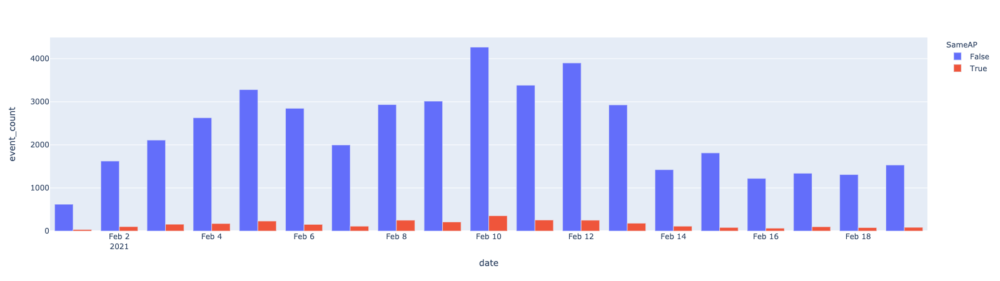

In [26]:
%%local
px.bar(df_pp.groupby(["date","SameAP"]).event_count.sum().reset_index(),x="date", y="event_count", color="SameAP", barmode="group")

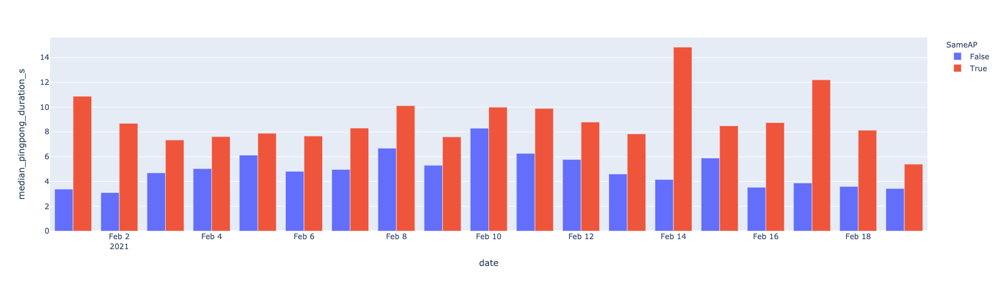

In [35]:
%%local
# Pingpong duration
px.bar(df_pp.groupby(["date","SameAP"]).median_pingpong_duration_s.sum().reset_index(),x="date", y="median_pingpong_duration_s", color="SameAP", barmode="group")

# Sticky Client

In [9]:
# Sticky Client Raw Data
input_files = "s3://mist-secorapp-production/sticky-client/sticky-client-production/dt=2021-02-10/*/*.seq"
data_rdd = spark.sparkContext.sequenceFile(input_files).map(lambda r: json.loads(r[1])).filter(lambda r: r["Sticky"]==True)
df_sc= spark.createDataFrame(data_rdd)
df_sc.printSchema()
df_sc.show()
print(df_sc.limit(1).collect())

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

root
 |-- Assoc: map (nullable = true)
 |    |-- key: string
 |    |-- value: string (valueContainsNull = true)
 |-- RoamCandidates: array (nullable = true)
 |    |-- element: map (containsNull = true)
 |    |    |-- key: string
 |    |    |-- value: string (valueContainsNull = true)
 |-- Sticky: boolean (nullable = true)
 |-- Version: long (nullable = true)
 |-- WC: string (nullable = true)
 |-- When: string (nullable = true)

+--------------------+--------------------+------+-------+-----------------+--------------------+
|               Assoc|      RoamCandidates|Sticky|Version|               WC|                When|
+--------------------+--------------------+------+-------+-----------------+--------------------+
|[OrgID -> 4f7ce01...|[[RSSI -> -72, Ba...|  true|      3|e2-9e-cb-1b-1a-a8|2021-02-10T00:45:...|
|[OrgID -> 4f7ce01...|[[RSSI -> -67, Ba...|  true|      3|ca-47-45-d4-5c-a7|2021-02-10T00:45:...|
|[OrgID -> 4f7ce01...|[[RSSI -> -58, Ba...|  true|      3|c0-84-7d-20-d6-ac|20

In [5]:
df_sc = spark.read.parquet("s3://mist-data-science-dev/may/roaming_exploration/sticky_client_flatten/").withColumn("RSSI_diff",F.col("CurrentRSSI")-F.col("Candidate_RSSI"))
df_sc.show()

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+-----------------+--------------------+--------------------+----+-----------+-----------------+--------------+--------------+-----------------+--------------------+----------+---------+
|               WC|               OrgID|              SiteID|Band|CurrentRSSI|        currentAP|Candidate_Band|Candidate_RSSI|     Candidate_AP|                When|      date|RSSI_diff|
+-----------------+--------------------+--------------------+----+-----------+-----------------+--------------+--------------+-----------------+--------------------+----------+---------+
|c0-84-7d-c9-58-40|4f7ce014-2148-4d4...|2b691141-0344-47f...|   5|        -83|5c-5b-35-53-a0-c0|             5|           -70|d4-20-b0-41-5c-f7|2021-02-10T18:00:...|2021-02-10|    -13.0|
|c0-84-7d-c9-58-40|4f7ce014-2148-4d4...|2b691141-0344-47f...|   5|        -83|5c-5b-35-53-a0-c0|           2.4|           -70|d4-20-b0-41-5c-f7|2021-02-10T18:00:...|2021-02-10|    -13.0|
|42-d6-33-3b-e3-46|4f7ce014-2148-4d4...|19216f53-1b26-4c6...|   5

In [67]:
# top 10 orgID for sticky clients
df_sc.groupby("OrgID").agg(F.count("WC").alias("event_count"),F.countDistinct("WC").alias("count_distinct_WC")).withColumn("avg_event_per_WC", F.col("event_count")/F.col("count_distinct_WC")).sort(F.desc("event_count")).show(20,truncate=False)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+------------------------------------+-----------+-----------------+------------------+
|OrgID                               |event_count|count_distinct_WC|avg_event_per_WC  |
+------------------------------------+-----------+-----------------+------------------+
|4f7ce014-2148-4d41-88f0-07c9c2e6f16c|11166654   |29319            |380.86749206998877|
|0992350f-e897-4719-8671-010a7e4ebf9c|4709050    |29471            |159.7858912150928 |
|a15b4c50-378e-4103-974e-ea9014cd281b|1082509    |4640             |233.29935344827587|
|758a1f7f-6d65-4d85-90b2-0775b8b476bc|579366     |5169             |112.08473592571097|
|9de2eacf-bc8a-46cc-ad0e-e81780f1095b|552072     |13666            |40.39748280403922 |
|2cd327d0-d323-4bef-b455-9dca175026b2|501272     |554              |904.8231046931407 |
|20101562-d4f8-41aa-aaa9-98349d78dfa0|397515     |15076            |26.367405147253912|
|b2e5fc49-d460-42b9-893c-27dbaff943aa|328867     |5677             |57.92971639950678 |
|4a7f417d-a4b1-4452-804e-589a29d

In [4]:
# count of sticky client per band
sticky_client_count = df_sc.groupby("When","WC","date","Band").agg(F.count("Candidate_AP").alias("RoamCandidate_count"))
sticky_client_count.groupby("RoamCandidate_count").agg(F.count("WC").alias("event_count")).sort(F.desc("event_count")).show(500)
# histogram of roamcandidate_count

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+-------------------+-----------+
|RoamCandidate_count|event_count|
+-------------------+-----------+
|                  2|    5390022|
|                  1|    1330850|
|                  4|     885690|
|                  6|     319467|
|                  8|     152785|
|                  3|     125902|
|                 10|      48368|
|                  5|      43468|
|                 16|      40714|
|                 12|      28312|
|                  7|      23468|
|                 14|      17687|
|                  9|       1864|
|                 11|       1392|
|                 13|       1083|
|                 15|        261|
+-------------------+-----------+

In [66]:
df_sc.groupby("Band").agg(F.count("WC").alias("event_count")).show()
temp = df_sc.groupby("date","Band").agg(F.count("WC").alias("event_count"))

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+----+-----------+
|Band|event_count|
+----+-----------+
| 2.4|    3387450|
|    |         74|
|   5|   17937082|
+----+-----------+

In [41]:
%%spark -o temp

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

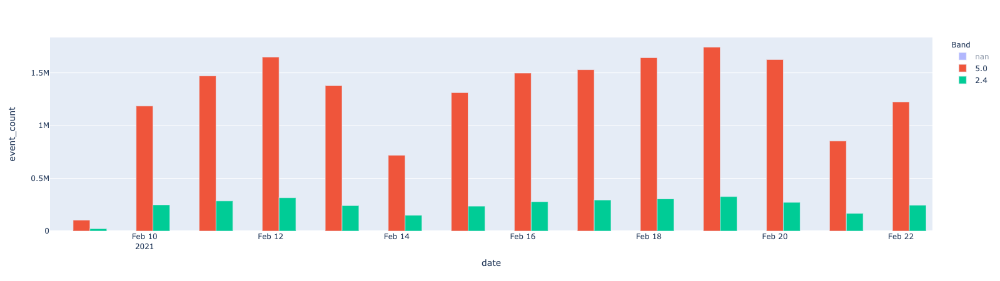

In [27]:
%%local
## sticky client event count per band
temp["Band"] = temp["Band"].astype(str)
px.bar(temp,x="date",y="event_count",color="Band",barmode="group")

In [4]:
%%spark -o df_sc

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

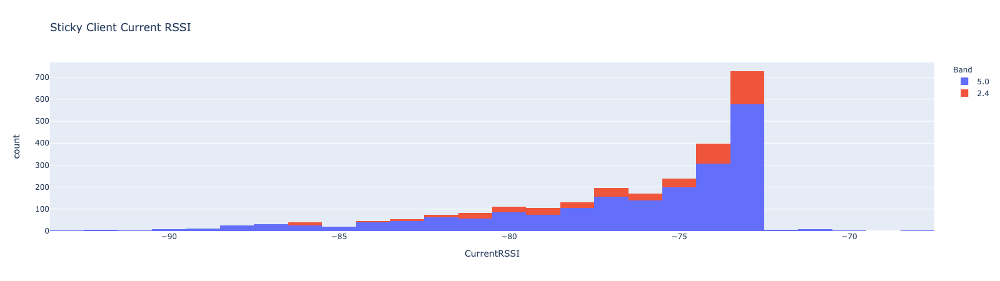

In [46]:
%%local
#Sticky Client Current RSSI Histogram
px.histogram(df_sc,x="CurrentRSSI",title="Sticky Client Current RSSI",color = "Band")

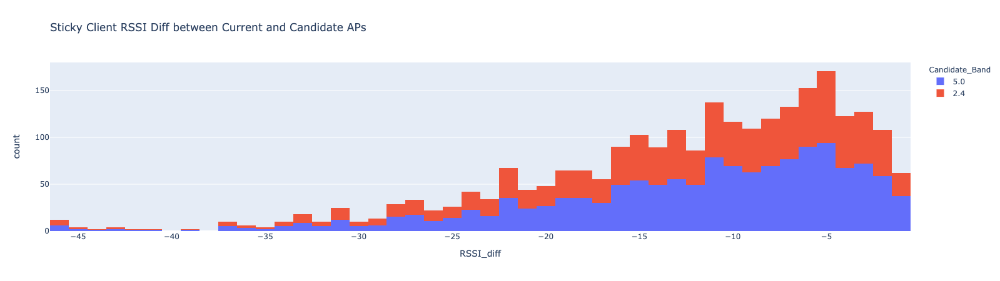

In [8]:
%%local
#Sticky Client Current RSSI Histogram
px.histogram(df_sc,x="RSSI_diff",title="Sticky Client RSSI Diff between Current and Candidate APs",color = "Candidate_Band")

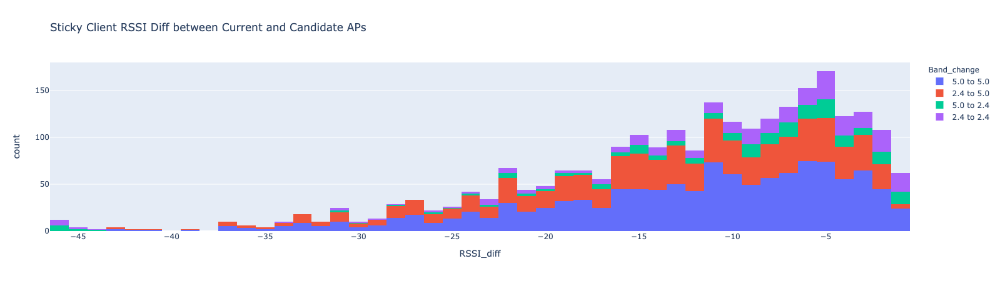

In [10]:
%%local
#Sticky Client Current RSSI Histogram
df_sc["Band_change"] = df_sc[["Band","Candidate_Band"]].apply(lambda x: "{} to {}".format(x[1],x[0]),axis=1)
df_sc["SameAP"] = df["CurrentAP"]
px.histogram(df_sc,x="RSSI_diff",title="Sticky Client RSSI Diff between Current and Candidate APs",color = "Band_change")


In [12]:
df_sc.withColumn("SameAP",F.col("CurrentAP")==F.col("Candidate_AP")).groupby("SameAP").agg(F.count("WC").alias("event_count")).show()

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+------+-----------+
|SameAP|event_count|
+------+-----------+
|  true|     184945|
| false|    4169606|
+------+-----------+

# Global Event View